### Questão 2)  

$\boxed{\dfrac{\partial u}{dt} = D \dfrac{\partial ^2 u}{dx^2}}$ 

Use o **método de Crank-Nicholson** para resolver a equação de difusão unidimensional, com condições de contorno refletoras em $x=0$ e $x=L$, e a condição inicial de um pulso triangular. Descreva a forma do perfil em tempos longos.


$u_{j, n} = -\alpha u_{j-1, n+1} + (1+2\alpha)u_{j,n+1} - \alpha u_{j+1, n+1}$ com $\alpha = \dfrac{D\Delta t}{(\Delta x)^2}$

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import HTML
plt.style.use('tableau-colorblind10')

In [2]:
# Parâmetros Numéricos
L = 1
Nx = 1_000
Nsteps = 620 # ou menos
x = np.linspace(0, L, Nx)
dx = x[1] - x[0] # 10e-3
dt = 1E-3
D = 1
alpha = dt / dx**2 # D = 1

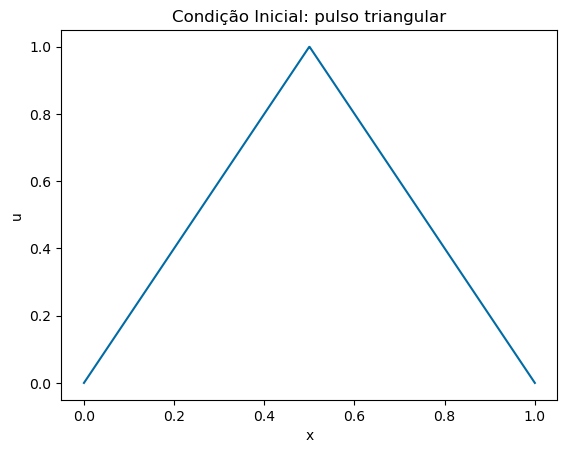

In [3]:
u0 = np.array([2*xi if xi <= 0.5 else 2*(1-xi) for xi in x])
plt.title('Condição Inicial: pulso triangular')
plt.xlabel('x')
plt.ylabel('u')
plt.plot(x, u0)

In [4]:
# Matriz tridiagonal do Crank-Nicolson
N = len(x)
print(N, N==Nx)
A = np.zeros((N-2, N-2))
B = np.zeros((N-2, N-2))

# Diagonal Principal
for i in range(0, N-2):
    A[i,i] = 2 + 2*alpha
    B[i,i] = 2 - 2*alpha

# Outras duas diagonais
for i in range(0, N-3):
    
    A[i+1, i] = -alpha
    A[i, i+1] = -alpha
    
    B[i+1, i] = alpha
    B[i, i+1] = alpha

Ainv = np.linalg.inv(A)

1000 True


In [5]:
u = np.zeros((Nsteps, Nx))
u[0] = u0
# Crank-Nicolson 
for i in range(Nsteps - 1):
    u[i+1][1:-1] = np.dot(Ainv, np.dot(B, u[i][1:-1]))


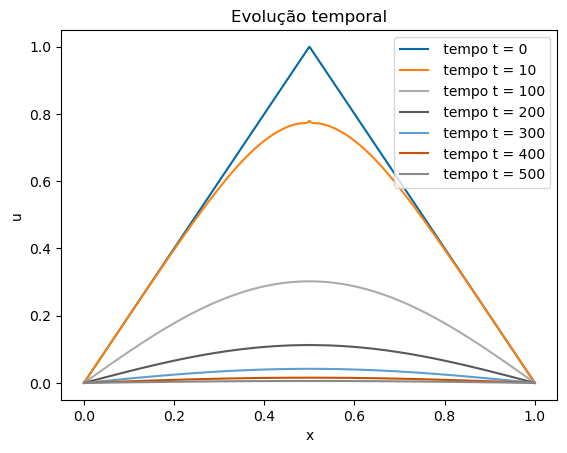

In [6]:
indexes = [0, 10, 100, 200, 300, 400, 500]
for i in indexes:
    plt.title("Evolução temporal")
    plt.plot(x, u[i], label=f' tempo t = {i}')
    plt.xlabel('x')
    plt.ylabel('u')
    plt.legend()

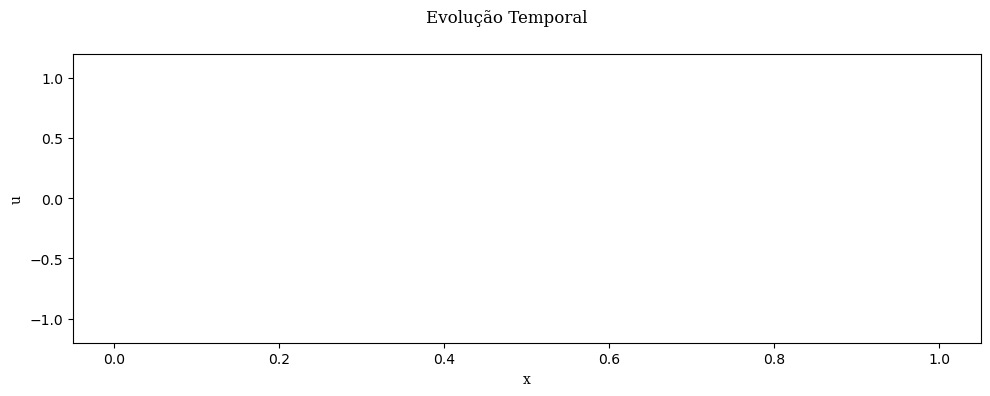

In [7]:
import matplotlib.animation as animation

plt.rcParams['figure.figsize'] = [10, 4] # tamanho das figuras
font = {'family': 'serif',
        'weight': 'normal',
        }
# Função para atualizar o gráfico a cada quadro da animação
def update_plot(i, data, line):
    line.set_ydata(data[i])
    return line,

# Configuração inicial do gráfico
fig, ax = plt.subplots()
plt.suptitle("Evolução Temporal", font=font)
plt.ylabel('u', font=font)
plt.xlabel('x', font=font)
plt.tight_layout()
line, = ax.plot(x, u0, c='white')
ax.set_ylim(-1.2, 1.2)

# Criação da animação
ani = animation.FuncAnimation(fig, update_plot, frames=len(u), fargs=(u, line), interval=20, blit=True)
HTML(ani.to_jshtml())
# Salvar a animação em um arquivo de vídeo
# ani.save('JANVO.mp4', writer='ffmpeg')

# Mostrar o gráfico
# plt.show()

##### **Referências**  
- http://www.claudiobellei.com/2016/11/10/crank-nicolson/
- https://youtu.be/wqLOXOkrnFw
- Código da animação adaptado de João Pedro Marchetti
